# Tabular Letter Recognition

#### [Base de Dados](wwydmanski/tabular-letter-recognition)

O objetivo é identificar cada um de um grande número de displays de pixels retangulares em preto e branco como uma das 26 letras maiúsculas do alfabeto inglês. As imagens dos caracteres foram baseadas em 20 fontes diferentes e cada letra dentro dessas 20 fontes foi distorcida aleatoriamente para produzir um arquivo de 20.000 estímulos únicos. 

Cada estímulo foi convertido em 16 atributos numéricos primitivos (momentos estatísticos e contagens de arestas) que foram então dimensionados para caber em um intervalo de valores inteiros de 0 a 15. Normalmente treinamos nos primeiros 16.000 itens e então usamos o modelo resultante para prever a categoria de letras para os 4.000 restantes. Veja o artigo citado acima para mais detalhes.

### Descrição de cada Coluna

1) posição horizontal da caixa x-box (inteiro)
2) posição vertical da caixa y-box (inteiro)
3) largura largura da caixa (inteiro)
4) altura alta da caixa (inteiro)
5) total onpix # em pixels (inteiro)
6) média x-bar x de pixels na caixa (inteiro)
7) média y-bar y de pixels na caixa (inteiro)
8) variância média x2bar (inteiro)
9) variância média y2bar y (inteiro)
10) correlação média xybar x y (inteiro)
11) média x2ybr de x * x * y (inteiro)
12) média xy2br de x * y * y (inteiro)
13) contagem média de arestas x-ege da esquerda para a direita (inteiro)
14) correlação xegvy de x-ege com y (inteiro)
15) contagem média de arestas y-ege de baixo para cima (inteiro)
16) correlação yegvx de y-ege com x (inteiro)

In [26]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import sklearn.preprocessing as StandardScaler

In [ ]:
df_train = pd.read_csv('data/train.csv')
df_test = pd.read_csv('data/test.csv')

In [15]:
# junta os df 
df = pd.concat([df_train, df_test], sort=False)
df

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,target
0,4,7,5,5,4,6,7,3,7,11,8,9,3,8,4,8,E
1,4,7,6,5,5,6,8,3,7,11,8,9,3,8,4,7,E
2,3,5,4,3,3,7,8,5,5,7,7,6,5,9,2,6,N
3,4,10,6,7,6,5,7,5,7,6,6,12,3,8,6,9,K
4,4,10,6,8,4,8,11,2,3,4,10,9,3,11,1,8,V
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,4,7,6,5,7,6,6,3,2,8,6,7,3,7,11,2,S
3996,2,1,3,3,1,6,12,3,6,8,11,7,1,11,1,7,T
3997,5,10,7,9,4,8,5,9,8,5,4,8,3,8,4,8,Q
3998,4,5,5,7,5,10,11,5,4,5,8,8,5,10,9,5,Y


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20000 entries, 0 to 3999
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   1       20000 non-null  int64 
 1   2       20000 non-null  int64 
 2   3       20000 non-null  int64 
 3   4       20000 non-null  int64 
 4   5       20000 non-null  int64 
 5   6       20000 non-null  int64 
 6   7       20000 non-null  int64 
 7   8       20000 non-null  int64 
 8   9       20000 non-null  int64 
 9   10      20000 non-null  int64 
 10  11      20000 non-null  int64 
 11  12      20000 non-null  int64 
 12  13      20000 non-null  int64 
 13  14      20000 non-null  int64 
 14  15      20000 non-null  int64 
 15  16      20000 non-null  int64 
 16  target  20000 non-null  object
dtypes: int64(16), object(1)
memory usage: 2.7+ MB


In [17]:
df.describe()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
count,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000
mean,4.023550,7.035500,5.121850,5.37245,3.505850,6.897600,7.500450,4.628600,5.178650,8.282050,6.45400,7.929000,3.046100,8.338850,3.691750,7.80120
std,1.913212,3.304555,2.014573,2.26139,2.190458,2.026035,2.325354,2.699968,2.380823,2.488475,2.63107,2.080619,2.332541,1.546722,2.567073,1.61747
min,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000
25%,3.000000,5.000000,4.000000,4.00000,2.000000,6.000000,6.000000,3.000000,4.000000,7.000000,5.00000,7.000000,1.000000,8.000000,2.000000,7.00000
50%,4.000000,7.000000,5.000000,6.00000,3.000000,7.000000,7.000000,4.000000,5.000000,8.000000,6.00000,8.000000,3.000000,8.000000,3.000000,8.00000
75%,5.000000,9.000000,6.000000,7.00000,5.000000,8.000000,9.000000,6.000000,7.000000,10.000000,8.00000,9.000000,4.000000,9.000000,5.000000,9.00000
max,15.000000,15.000000,15.000000,15.00000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.00000,15.000000,15.000000,15.000000,15.000000,15.00000


In [23]:
# valores unicos de cada coluna
for col in df.columns:
    print(col, df[col].value_counts())

1 1
4     4477
3     4157
5     3169
2     2909
6     1894
1     1261
7     1006
8      513
9      284
0      132
10     121
11      48
12      20
13       4
14       3
15       2
Name: count, dtype: int64
2 2
9     2702
7     2302
10    2211
8     2180
6     1705
11    1625
5     1566
4     1342
3     1330
1      778
0      709
2      530
12     321
13     271
15     230
14     198
Name: count, dtype: int64
3 3
5     4262
4     3816
6     3641
3     1994
7     1946
8     1418
2     1285
9      679
1      385
10     237
0      195
11      91
12      39
13       6
14       4
15       2
Name: count, dtype: int64
4 4
6     3656
8     3559
4     2718
7     2695
5     2675
3     1559
2     1304
1      883
0      365
9      347
10     103
11      76
12      31
14      15
13      10
15       4
Name: count, dtype: int64
5 5
2     4153
3     3939
4     3157
1     2437
5     2153
6     1379
7      857
0      830
8      519
9      283
10     142
11      85
12      40
13      13
14       7
15     

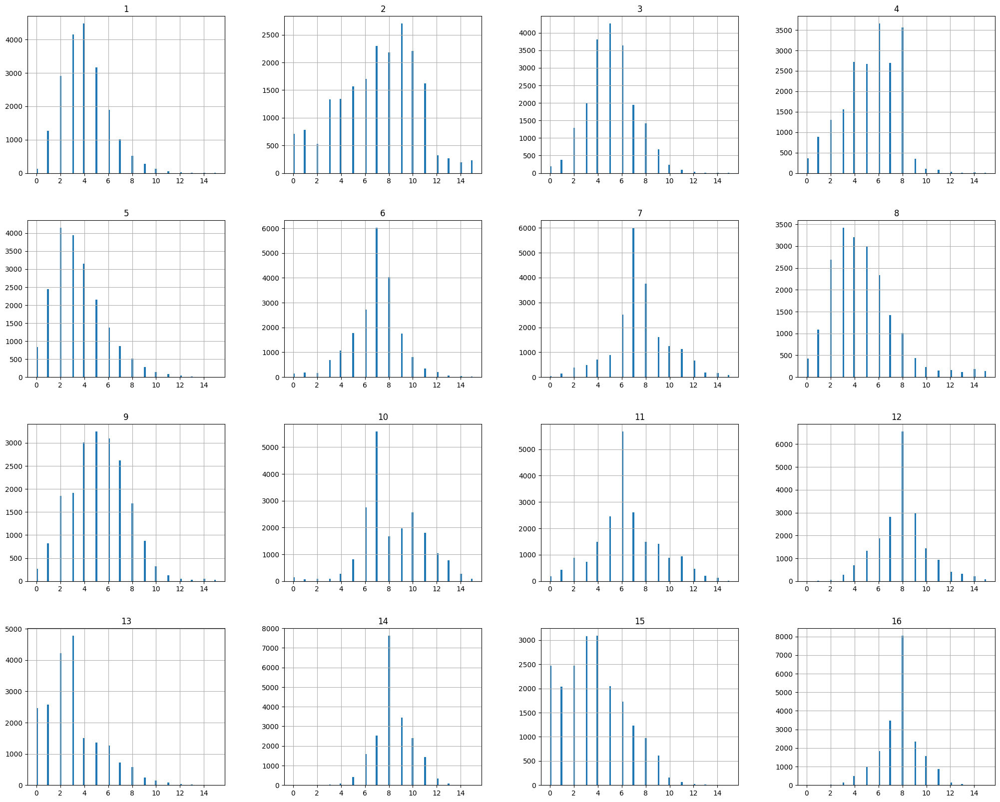

In [29]:
df.hist(bins=100, figsize=(25, 20))
plt.show()

<Axes: xlabel='target'>

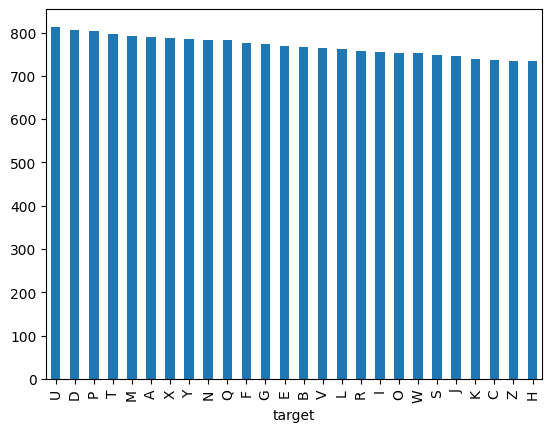

In [22]:
# print de valores unicos da coluna target
df['target'].value_counts().plot(kind='bar')

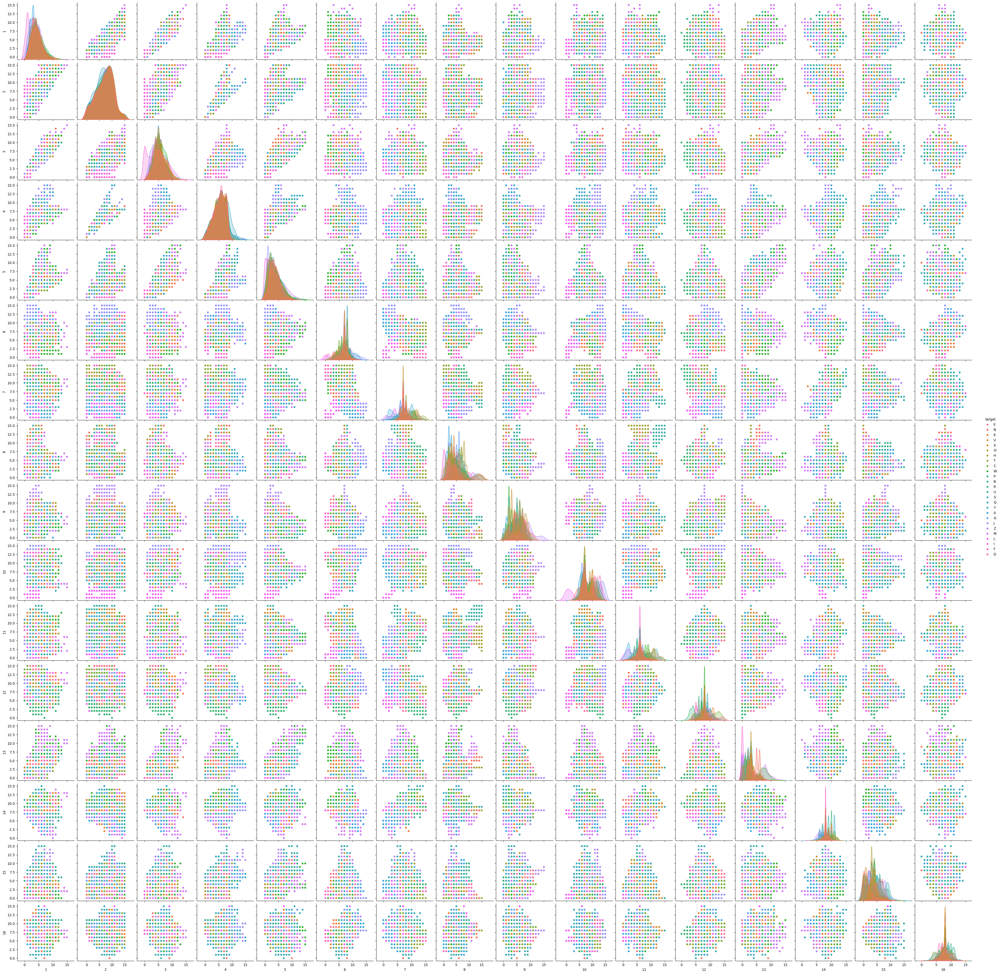

In [28]:
sns.pairplot(df, hue="target", diag_kind="kde")
plt.show()

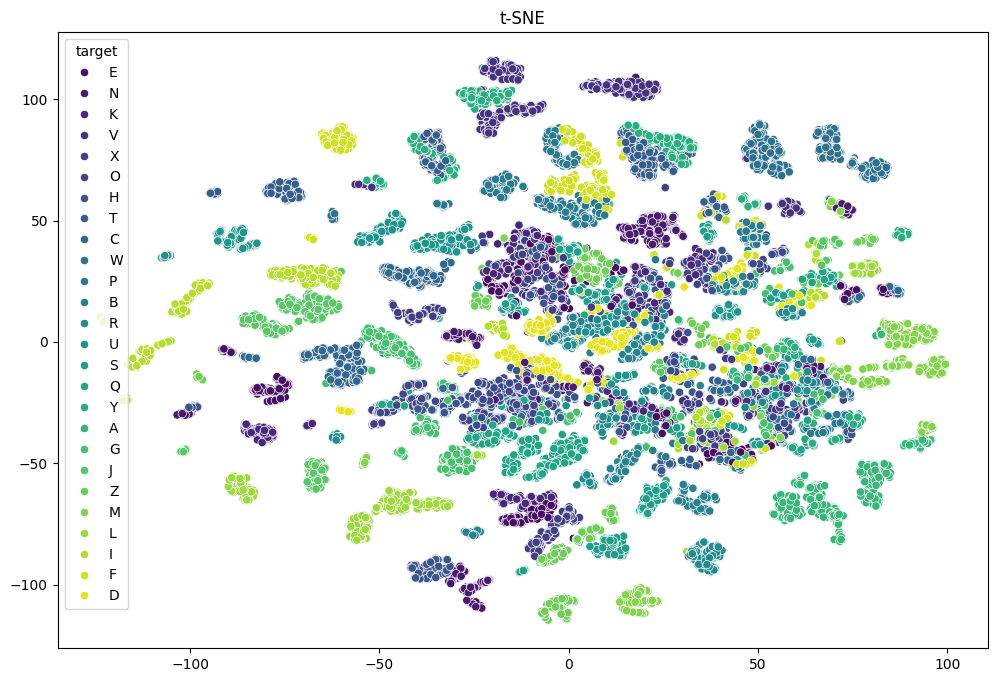

In [30]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Supondo que df seja o seu DataFrame original
X = df.drop('target', axis=1)
y = df['target']


# Aplicando LabelEncoder para transformar variavel alvo em numerica
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Padronizando as variáveis independentes
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Reduzindo a dimensionalidade
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# Plotando o gráfico
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=y, palette='viridis')
plt.title('t-SNE')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


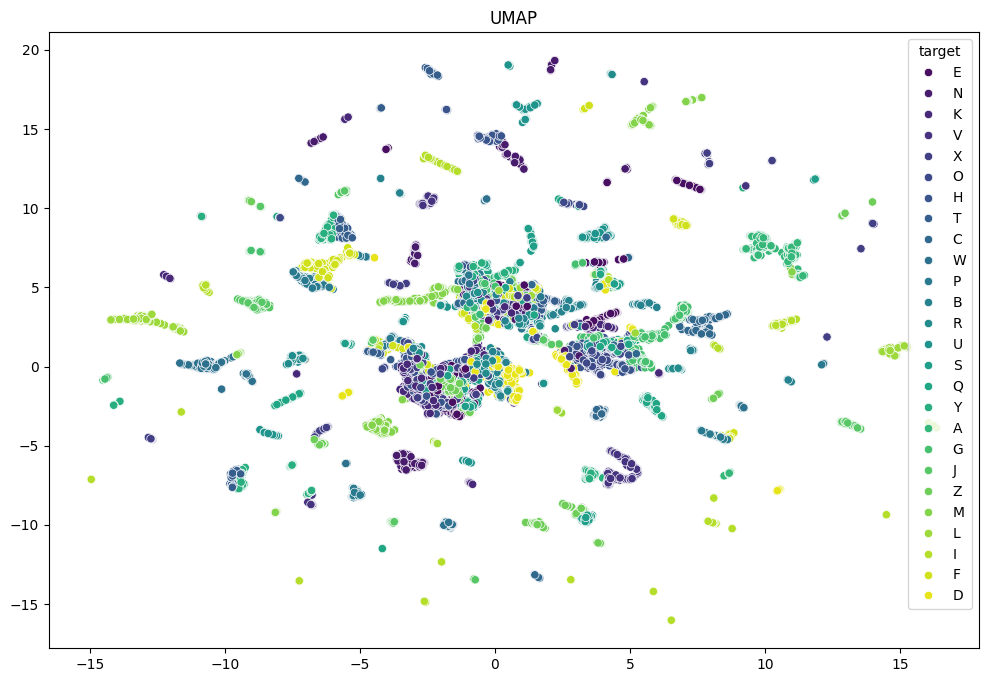

In [32]:
import umap

# Supondo que df seja o seu DataFrame original
X = df.drop('target', axis=1)
y = df['target']

# Aplicando LabelEncoder para transformar variavel alvo em numerica
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Padronizando as variáveis independentes
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Reduzindo a dimensionalidade com UMAP
umap_reducer = umap.UMAP(n_components=2, random_state=42)
X_umap = umap_reducer.fit_transform(X_scaled)

# Plotando o gráfico
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X_umap[:, 0], y=X_umap[:, 1], hue=y, palette='viridis')
plt.title('UMAP')
plt.show()

In [ ]:
# dividindo o df_train em x_train e y_train
x_train = df_train.drop('target', axis=1)
y_train = df_train['target']

# dividindo o df_test em x_test e y_test
x_test = df_test.drop('target', axis=1)
y_test = df_test['target']

# Aplicando LabelEncoder para transformar variavel alvo em numerica
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

# Padronizando as variáveis independentes
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)